In [1]:
## historical volatility < implied volatility

## large firms use put options as a form of insurance, so they are willing to pay more to mitigate downside risk

## learn how to compute historical volatility and ways to compare it to implied volatiltiy

## when historical volatility < implied volatilty 
## options might be overpriced(most common)

## when historical volatilty > implied volatility
## options might be underpriced(less common)

## the stock market places value where it see fit. usually foreseeing basic 
## supply / demand shifts, trust these shifts and invest in them

In [2]:
from update_prices import load_symbol

In [3]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as pylo
import plotly.graph_objects as go
import pandas as pd
import numpy as np

In [4]:
pylo.init_notebook_mode(connected=True)

In [40]:
import duckdb

con = duckdb.connect(r"C:\Users\ryan0\data\market_data.duckdb", read_only=True)

print(con.execute("SHOW TABLES").fetchall())
print(con.execute("SELECT COUNT(*) FROM stock_data").fetchall())

[('stock_data',)]
[(120279,)]


In [6]:
from pathlib import Path
from config import DB_PATH
print(Path(DB_PATH).resolve())

C:\Users\ryan0\data\market_data.duckdb


In [7]:
### use duckdb(get more familiar with sql), figure out how to 'dump' all api queries into a folder differeniated by UUID's

In [8]:
df = con.sql("SELECT symbol, week_date, adjusted_close FROM stock_data ORDER By symbol, week_date").df()

In [9]:
df["return"] = df.groupby("symbol")["adjusted_close"].pct_change()

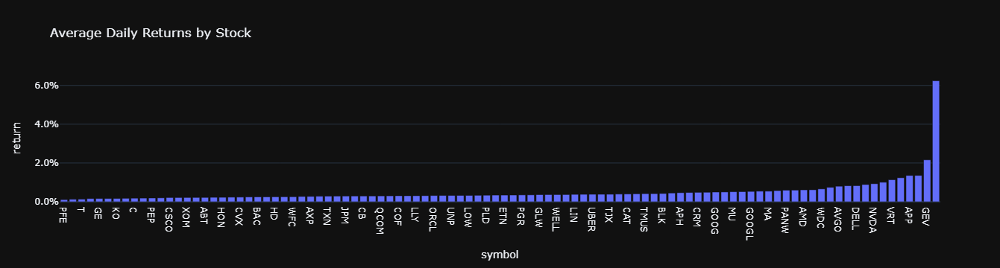

In [10]:
mean_returns = (
    df.groupby("symbol", as_index=False)["return"]
      .mean()
      .sort_values("return")
)

fig = px.bar(
    mean_returns,
    x="symbol",
    y="return",
    title="Average Daily Returns by Stock",
    template="plotly_dark"
)

fig.update_yaxes(tickformat=".1%")
fig.show()

In [13]:
lg["cum_log_return"] = (lg.groupby("symbol")["log_return"].cumsum())

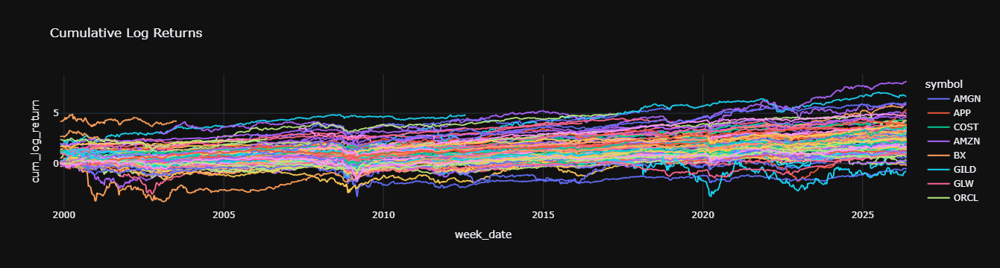

In [14]:
fig = px.line(
    lg,
    x="week_date",
    y="cum_log_return",
    color="symbol",
    title="Cumulative Log Returns",
    template="plotly_dark"
)

fig.show()

In [20]:
def backtest_zscore_mean_reversion(con, window=20, threshold=2.0, holding_weeks=1):
    return con.execute(f"""
        WITH base AS (
            SELECT
                symbol,
                week_date,
                adjusted_close,

                AVG(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_mean,

                STDDEV_SAMP(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_std,

                COUNT(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_count

            FROM stock_data
        ),

        zscores AS (
            SELECT
                *,
                (adjusted_close - rolling_mean) / rolling_std AS z_score
            FROM base
            WHERE rolling_count = {window}
              AND rolling_std IS NOT NULL
              AND rolling_std != 0
        ),

        signals AS (
            SELECT
                *,
                CASE
                    WHEN z_score >= {threshold} THEN -1
                    WHEN z_score <= -{threshold} THEN 1
                    ELSE 0
                END AS signal,

                CASE
                    WHEN z_score >= {threshold} THEN 'sell'
                    WHEN z_score <= -{threshold} THEN 'buy'
                    ELSE 'hold'
                END AS signal_label
            FROM zscores
        ),

        forward_returns AS (
            SELECT
                *,
                LEAD(adjusted_close, {holding_weeks}) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                ) AS future_close
            FROM signals
        )

        SELECT
            symbol,
            week_date,
            adjusted_close,
            future_close,
            rolling_mean,
            rolling_std,
            z_score,
            signal,
            signal_label,

            future_close / adjusted_close - 1 AS forward_return,

            signal * (future_close / adjusted_close - 1) AS strategy_return

            

        FROM forward_returns
        WHERE signal != 0
          AND future_close IS NOT NULL

        ORDER BY week_date DESC, ABS(z_score) DESC
    """).df()

In [21]:
results = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    bt = backtest_zscore_mean_reversion(
        con,
        window=20,
        threshold=threshold,
        holding_weeks=4,
    )

    summary = (
        bt.groupby(["signal_label"])
          .agg(
              trades=("strategy_return", "count"),
              avg_return=("strategy_return", "mean"),
              median_return=("strategy_return", "median"),
              win_rate=("strategy_return", lambda x: (x > 0).mean()),
              total_return=("strategy_return", "sum"),
              best_trade=("strategy_return", "max"),
              worst_trade=("strategy_return", "min"),
          )
          .reset_index()
    )

    summary["threshold"] = threshold
    results.append(summary)

threshold_results = pd.concat(results, ignore_index=True)

threshold_results

,signal_label,trades,avg_return,median_return,win_rate,total_return,best_trade,worst_trade,threshold
0,buy,10463,0.024717,0.021404,0.595432,258.618591,1.164033,-0.685666,1.5
1,sell,25032,-0.010659,-0.009785,0.429890,-266.811720,0.594102,-1.708134,1.5
2,buy,3841,0.032074,0.028251,0.620411,123.194629,0.976838,-0.685666,2.0
3,sell,8515,-0.011551,-0.009022,0.435115,-98.355144,0.533898,-1.708134,2.0
4,buy,1028,0.041301,0.035338,0.636187,42.457673,0.862064,-0.685666,2.5
5,sell,1755,-0.016574,-0.008848,0.438746,-29.087114,0.533898,-1.708134,2.5
6,buy,244,0.081255,0.055202,0.676230,19.826213,0.675407,-0.334601,3.0
7,sell,273,-0.028195,-0.013619,0.410256,-7.697171,0.533898,-1.002565,3.0


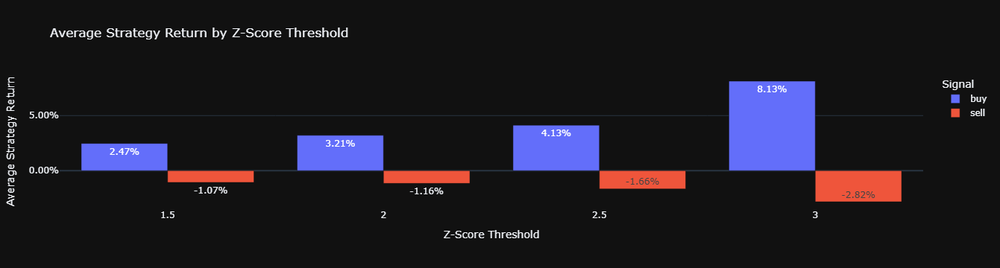

In [22]:
fig = px.bar(
    threshold_results,
    x="threshold",
    y="avg_return",
    color="signal_label",
    barmode="group",
    text_auto=".2%",
    title="Average Strategy Return by Z-Score Threshold",
    labels={
        "threshold": "Z-Score Threshold",
        "avg_return": "Average Strategy Return",
        "signal_label": "Signal"
    },
    template="plotly_dark"
)

fig.update_layout(
    yaxis_tickformat=".2%",
    hovermode="x unified"
)

fig.show()

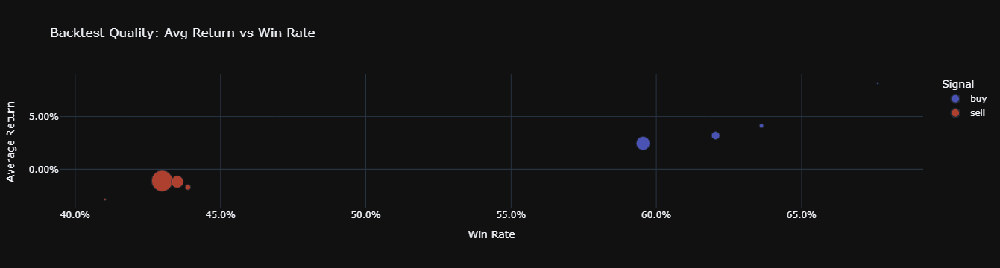

In [23]:
fig = px.scatter(
    threshold_results,
    x="win_rate",
    y="avg_return",
    color="signal_label",
    size="trades",
    hover_data=["threshold", "trades", "total_return", "best_trade", "worst_trade"],
    title="Backtest Quality: Avg Return vs Win Rate",
    labels={
        "win_rate": "Win Rate",
        "avg_return": "Average Return",
        "signal_label": "Signal",
        "trades": "Number of Trades"
    },
    template="plotly_dark"
)

fig.update_layout(
    xaxis_tickformat=".1%",
    yaxis_tickformat=".2%"
)

fig.show()

In [ ]:
bt.sort_values(
    ["week_date"],
    ascending=[False]
).head(25)

In [ ]:
recent_buys = (
    bt[bt["signal_label"] == "buy"]
      .sort_values("week_date", ascending=False)
      .head(25)
)

recent_buys

In [26]:
all_trades = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    bt = backtest_zscore_mean_reversion(
        con,
        window=20,
        threshold=threshold,
        holding_weeks=4
    )

    bt["threshold"] = threshold
    all_trades.append(bt)

trades_all_thresholds = pd.concat(all_trades, ignore_index=True)

In [ ]:
recent_all = (
    trades_all_thresholds
    .sort_values("week_date", ascending=False)
    .head(50)
)
recent_all

In [28]:
def backtest_high_low_zscore_mean_reversion(
    con,
    window=20,
    threshold=2.0,
    holding_weeks=1
):
    return con.execute(f"""
        WITH adjusted_prices AS (
            SELECT
                symbol,
                week_date,
                close,
                adjusted_close,

                -- Adjust raw high/low onto the same scale as adjusted_close
                high * (adjusted_close / close) AS adjusted_high,
                low * (adjusted_close / close) AS adjusted_low

            FROM stock_data
            WHERE close IS NOT NULL
              AND close != 0
              AND adjusted_close IS NOT NULL
        ),

        base AS (
            SELECT
                symbol,
                week_date,
                adjusted_high,
                adjusted_low,
                adjusted_close,

                AVG(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_mean,

                STDDEV_SAMP(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_std,

                COUNT(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_count

            FROM adjusted_prices
        ),

        zscores AS (
            SELECT
                *,
                (adjusted_close - rolling_mean) / rolling_std AS close_z_score,
                (adjusted_high - rolling_mean) / rolling_std AS high_z_score,
                (adjusted_low - rolling_mean) / rolling_std AS low_z_score

            FROM base
            WHERE rolling_count = {window}
              AND rolling_std IS NOT NULL
              AND rolling_std != 0
        ),

        signals AS (
            SELECT
                *,
                CASE
                    WHEN low_z_score <= -{threshold} THEN 1
                    WHEN high_z_score >= {threshold} THEN -1
                    ELSE 0
                END AS signal,

                CASE
                    WHEN low_z_score <= -{threshold} THEN 'buy'
                    WHEN high_z_score >= {threshold} THEN 'sell'
                    ELSE 'hold'
                END AS signal_label,

                CASE
                    WHEN low_z_score <= -{threshold} THEN low_z_score
                    WHEN high_z_score >= {threshold} THEN high_z_score
                    ELSE close_z_score
                END AS trigger_z_score,

                CASE
                    WHEN low_z_score <= -{threshold} THEN 'weekly_adjusted_low'
                    WHEN high_z_score >= {threshold} THEN 'weekly_adjusted_high'
                    ELSE 'none'
                END AS trigger_source

            FROM zscores
        ),

        forward_returns AS (
            SELECT
                *,
                LEAD(adjusted_close, {holding_weeks}) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                ) AS future_close
            FROM signals
        )

        SELECT
            symbol,
            week_date,

            adjusted_high,
            adjusted_low,
            adjusted_close,
            future_close,

            rolling_mean,
            rolling_std,

            close_z_score,
            high_z_score,
            low_z_score,
            trigger_z_score,
            trigger_source,

            signal,
            signal_label,

            future_close / adjusted_close - 1 AS forward_return,

            signal * (future_close / adjusted_close - 1) AS strategy_return

        FROM forward_returns
        WHERE signal != 0
          AND future_close IS NOT NULL

        ORDER BY week_date DESC, ABS(trigger_z_score) DESC
    """).df()

In [29]:
results = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    btwo = backtest_high_low_zscore_mean_reversion(
        con,
        window=20,
        threshold=threshold,
        holding_weeks=4,
    )

    summary = (
        btwo.groupby(["signal_label"])
          .agg(
              trades=("strategy_return", "count"),
              avg_return=("strategy_return", "mean"),
              median_return=("strategy_return", "median"),
              win_rate=("strategy_return", lambda x: (x > 0).mean()),
              total_return=("strategy_return", "sum"),
              best_trade=("strategy_return", "max"),
              worst_trade=("strategy_return", "min"),
          )
          .reset_index()
    )

    summary["threshold"] = threshold
    results.append(summary)

threshold_results = pd.concat(results, ignore_index=True)

threshold_results

,signal_label,trades,avg_return,median_return,win_rate,total_return,best_trade,worst_trade,threshold
0,buy,19999,0.019611,0.018365,0.588879,392.201616,1.164033,-0.752289,1.5
1,sell,41547,-0.011438,-0.010827,0.425061,-475.218788,0.626296,-1.959184,1.5
2,buy,9625,0.020620,0.019160,0.591273,198.466955,0.976838,-0.685666,2.0
3,sell,18271,-0.011314,-0.010052,0.429697,-206.719242,0.623170,-1.959184,2.0
4,buy,3642,0.021560,0.020785,0.589511,78.520005,0.862064,-0.685666,2.5
5,sell,5198,-0.015261,-0.010840,0.425164,-79.326488,0.533898,-1.959184,2.5
6,buy,1283,0.030486,0.027559,0.600935,39.114119,0.862064,-0.525331,3.0
7,sell,1228,-0.019509,-0.011315,0.422638,-23.957059,0.533898,-1.588732,3.0


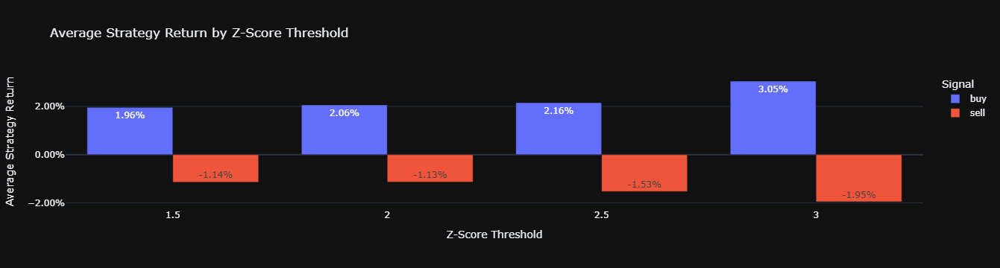

In [30]:
fig = px.bar(
    threshold_results,
    x="threshold",
    y="avg_return",
    color="signal_label",
    barmode="group",
    text_auto=".2%",
    title="Average Strategy Return by Z-Score Threshold",
    labels={
        "threshold": "Z-Score Threshold",
        "avg_return": "Average Strategy Return",
        "signal_label": "Signal"
    },
    template="plotly_dark"
)

fig.update_layout(
    yaxis_tickformat=".2%",
    hovermode="x unified"
)

fig.show()

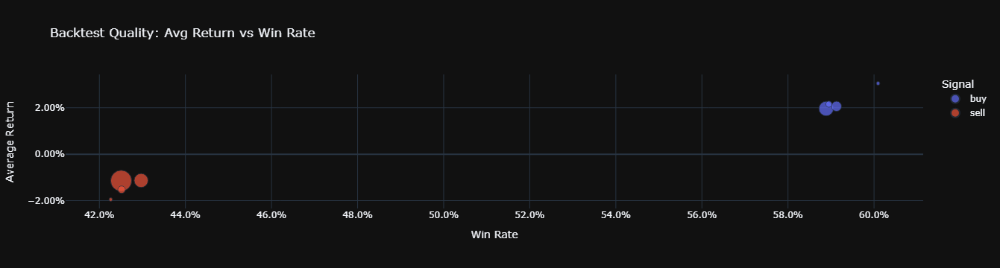

In [31]:
fig = px.scatter(
    threshold_results,
    x="win_rate",
    y="avg_return",
    color="signal_label",
    size="trades",
    hover_data=["threshold", "trades", "total_return", "best_trade", "worst_trade"],
    title="Backtest Quality: Avg Return vs Win Rate",
    labels={
        "win_rate": "Win Rate",
        "avg_return": "Average Return",
        "signal_label": "Signal",
        "trades": "Number of Trades"
    },
    template="plotly_dark"
)

fig.update_layout(
    xaxis_tickformat=".1%",
    yaxis_tickformat=".2%"
)

fig.show()

In [34]:
def backtest_consecutive_close_zscore(
    con,
    window=20,
    threshold=2.5,
    min_consecutive_weeks=2,
    holding_weeks=4
):
    return con.execute(f"""
        WITH base AS (
            SELECT
                symbol,
                week_date,
                adjusted_close,

                AVG(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_mean,

                STDDEV_SAMP(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_std,

                COUNT(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_count

            FROM stock_data
        ),

        zscores AS (
            SELECT
                *,
                (adjusted_close - rolling_mean) / rolling_std AS close_z_score
            FROM base
            WHERE rolling_count = {window}
              AND rolling_std IS NOT NULL
              AND rolling_std != 0
        ),

        states AS (
            SELECT
                *,
                CASE
                    WHEN close_z_score <= -{threshold} THEN 'low_extreme'
                    WHEN close_z_score >= {threshold} THEN 'high_extreme'
                    ELSE 'normal'
                END AS z_state
            FROM zscores
        ),

        regime_flags AS (
            SELECT
                *,
                CASE
                    WHEN z_state != LAG(z_state) OVER (
                        PARTITION BY symbol
                        ORDER BY week_date
                    )
                    THEN 1
                    ELSE 0
                END AS regime_change
            FROM states
        ),

        regimes AS (
            SELECT
                *,
                SUM(regime_change) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN UNBOUNDED PRECEDING AND CURRENT ROW
                ) AS regime_id
            FROM regime_flags
        ),

        streaks AS (
            SELECT
                *,
                ROW_NUMBER() OVER (
                    PARTITION BY symbol, regime_id
                    ORDER BY week_date
                ) AS consecutive_weeks
            FROM regimes
        ),

        signals AS (
            SELECT
                *,
                CASE
                    WHEN z_state = 'low_extreme'
                     AND consecutive_weeks = {min_consecutive_weeks}
                    THEN 1

                    WHEN z_state = 'high_extreme'
                     AND consecutive_weeks = {min_consecutive_weeks}
                    THEN -1

                    ELSE 0
                END AS signal,

                CASE
                    WHEN z_state = 'low_extreme'
                     AND consecutive_weeks = {min_consecutive_weeks}
                    THEN 'buy_2_week_low_z'

                    WHEN z_state = 'high_extreme'
                     AND consecutive_weeks = {min_consecutive_weeks}
                    THEN 'sell_2_week_high_z'

                    ELSE 'hold'
                END AS signal_label
            FROM streaks
        ),

        forward_returns AS (
            SELECT
                *,
                LEAD(adjusted_close, {holding_weeks}) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                ) AS future_close
            FROM signals
        )

        SELECT
            symbol,
            week_date,
            adjusted_close,
            future_close,

            rolling_mean,
            rolling_std,
            close_z_score,
            z_state,
            consecutive_weeks,

            signal,
            signal_label,

            future_close / adjusted_close - 1 AS forward_return,

            signal * (future_close / adjusted_close - 1) AS strategy_return

        FROM forward_returns
        WHERE signal != 0
          AND future_close IS NOT NULL

        ORDER BY week_date DESC, ABS(close_z_score) DESC
    """).df()

In [35]:
results = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    bt_2week = backtest_consecutive_close_zscore(
        con,
        window=20,
        threshold=threshold,
        min_consecutive_weeks=2,
        holding_weeks=4,
    )

    summary = (
        bt_2week.groupby(["signal_label"])
          .agg(
              trades=("strategy_return", "count"),
              avg_return=("strategy_return", "mean"),
              median_return=("strategy_return", "median"),
              win_rate=("strategy_return", lambda x: (x > 0).mean()),
              total_return=("strategy_return", "sum"),
              best_trade=("strategy_return", "max"),
              worst_trade=("strategy_return", "min"),
              avg_z_score=("close_z_score", "mean"),
              median_z_score=("close_z_score", "median"),
          )
          .reset_index()
    )

    summary["threshold"] = threshold
    results.append(summary)

threshold_2week_results = pd.concat(results, ignore_index=True)

threshold_2week_results

,signal_label,trades,avg_return,median_return,win_rate,total_return,best_trade,worst_trade,avg_z_score,median_z_score,threshold
0,buy_2_week_low_z,2358,0.017474,0.016712,0.581849,41.203696,0.870078,-0.525331,-2.043660,-1.952456,1.5
1,sell_2_week_high_z,5134,-0.011375,-0.009095,0.432996,-58.400456,0.533898,-1.708134,1.996516,1.917796,1.5
2,buy_2_week_low_z,880,0.031070,0.024713,0.600000,27.341494,0.976838,-0.525331,-2.425720,-2.362773,2.0
3,sell_2_week_high_z,2119,-0.013428,-0.008970,0.431336,-28.453568,0.533898,-1.708134,2.358377,2.283883,2.0
4,buy_2_week_low_z,190,0.030371,0.028410,0.615789,5.770520,0.467756,-0.525331,-2.831621,-2.765606,2.5
5,sell_2_week_high_z,351,-0.016105,-0.010854,0.438746,-5.652682,0.533898,-1.708134,2.781893,2.734843,2.5
6,buy_2_week_low_z,24,0.197843,0.188046,0.875000,4.748236,0.620882,-0.136125,-3.280288,-3.191287,3.0
7,sell_2_week_high_z,28,-0.017295,-0.002022,0.464286,-0.484255,0.235804,-0.357367,3.170625,3.148999,3.0


In [41]:
def get_latest_zscore_scanner(con, threshold=3.0, window=20):
    return con.sql(f"""
        WITH adjusted_prices AS (
            SELECT
                symbol,
                week_date,
                close,
                adjusted_close,

                high * (adjusted_close / close) AS adjusted_high,
                low * (adjusted_close / close) AS adjusted_low

            FROM stock_data
            WHERE close IS NOT NULL
              AND close != 0
              AND adjusted_close IS NOT NULL
        ),

        base AS (
            SELECT
                symbol,
                week_date,
                adjusted_close,
                adjusted_high,
                adjusted_low,

                AVG(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_mean,

                STDDEV_SAMP(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_std,

                COUNT(adjusted_close) OVER (
                    PARTITION BY symbol
                    ORDER BY week_date
                    ROWS BETWEEN {window - 1} PRECEDING AND CURRENT ROW
                ) AS rolling_count

            FROM adjusted_prices
        ),

        zscores AS (
            SELECT
                *,
                (adjusted_close - rolling_mean) / rolling_std AS close_z_score,
                (adjusted_high - rolling_mean) / rolling_std AS high_z_score,
                (adjusted_low - rolling_mean) / rolling_std AS low_z_score
            FROM base
            WHERE rolling_count = {window}
              AND rolling_std IS NOT NULL
              AND rolling_std != 0
        ),

        latest_week AS (
            SELECT MAX(week_date) AS max_week
            FROM zscores
        )

        SELECT
            symbol,
            week_date,
            adjusted_close,
            adjusted_high,
            adjusted_low,
            rolling_mean,
            rolling_std,

            close_z_score,
            high_z_score,
            low_z_score,

            CASE
                WHEN low_z_score <= -{threshold} THEN 'buy_extreme_low'
                WHEN high_z_score >= {threshold} THEN 'sell_extreme_high'
                WHEN close_z_score <= -{threshold} THEN 'buy_extreme_close'
                WHEN close_z_score >= {threshold} THEN 'sell_extreme_close'
                ELSE 'watch'
            END AS signal_label,

            GREATEST(
                ABS(close_z_score),
                ABS(high_z_score),
                ABS(low_z_score)
            ) AS max_abs_z_score

        FROM zscores
        WHERE week_date = (SELECT max_week FROM latest_week)
          AND (
              close_z_score >= {threshold}
              OR close_z_score <= -{threshold}
              OR high_z_score >= {threshold}
              OR low_z_score <= -{threshold}
          )

        ORDER BY max_abs_z_score DESC
    """).df()

In [46]:
results = []

for threshold in [1.5, 2.0, 2.5, 3.0]:
    scanner = get_latest_zscore_scanner(
        con,
        threshold=threshold,
        window=20
    )

    scanner["threshold"] = threshold
    results.append(scanner)

latest_threshold_scanner = pd.concat(results, ignore_index=True)

latest_threshold_scanner_unique = (
    latest_threshold_scanner
    .sort_values(
        ["symbol", "week_date", "threshold"],
        ascending=[True, True, False]
    )
    .drop_duplicates(
        subset=["symbol", "week_date"],
        keep="first"
    )
    .sort_values("max_abs_z_score", ascending=False)
)

cols = [
    "threshold",
    "symbol",
    "week_date",
    "signal_label",
    "adjusted_close",
    "adjusted_high",
    "adjusted_low",
    "close_z_score",
    "high_z_score",
    "low_z_score",
    "max_abs_z_score",
]

latest_threshold_scanner_unique[cols]

,threshold,symbol,week_date,signal_label,adjusted_close,adjusted_high,adjusted_low,close_z_score,high_z_score,low_z_score,max_abs_z_score
9,2.5,CVS,2026-05-20,sell_extreme_high,93.25,96.4500,93.0000,2.041111,2.506619,2.004743,2.506619
1,1.5,MO,2026-05-20,sell_extreme_high,73.38,74.4100,72.7000,1.677313,1.910622,1.523285,1.910622
2,1.5,SBUX,2026-05-20,sell_extreme_high,106.50,108.1075,105.1101,1.639767,1.909280,1.406738,1.909280
3,1.5,LOW,2026-05-20,buy_extreme_low,221.07,222.6500,208.0000,-1.310876,-1.238775,-1.907309,1.907309
4,1.5,VRT,2026-05-20,sell_extreme_high,315.63,370.2950,314.2500,0.946458,1.865831,0.923248,1.865831
5,1.5,ABT,2026-05-20,buy_extreme_low,88.36,89.3448,84.4000,-1.317029,-1.231660,-1.660308,1.660308
6,1.5,ISRG,2026-05-20,buy_extreme_low,449.03,449.7700,421.9550,-0.905944,-0.886094,-1.632218,1.632218
7,1.5,BKNG,2026-05-20,buy_extreme_low,156.95,160.9100,150.1400,-1.165219,-0.939953,-1.552607,1.552607
